# Assignment 5 Optional
# 1. Image Segmentation using K-Means Clustering

### Image Segmentation:
In computer vision, image segmentation is the process of partitioning an image into multiple segments. The goal of segmenting an image is to change the representation of an image into something that is more meaningful and easier to analyze. It is usually used for locating objects and creating boundaries.


It is not a great idea to process an entire image because many parts in an image may not contain any useful information. Therefore, by segmenting the image, we can make use of only the important segments for processing.


An image is basically a set of given pixels. In image segmentation, pixels which have similar attributes are grouped together. Image segmentation creates a pixel-wise mask for objects in an image which gives us a more comprehensive and granular understanding of the object.

### Uses 

1. Used in self-driving cars. Autonomous driving is not possible without object detection which involves segmentation.

2. Used in the healthcare industry. Helpful in segmenting cancer cells and tumours using which their severity can be gauged.

### K-Means Clustering
K-means clustering is one of the most popular unsupervised clustering algorithms. A cluster implies a collection of data points grouped together because of some similarities. There are a large number of applications of clustering such as segmentation, sorting, marketing and sales, and etc.

In [1]:
# Importing libraries
import numpy as np
import cv2
import numpy as np
import pandas as pd 

import matplotlib.pyplot as plt
import matplotlib.image as image
%matplotlib inline
plt.style.use("ggplot")

from skimage import io
from skimage.io import imread, imshow
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.datasets import load_sample_image
import seaborn as sns; sns.set()

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/opt/anaconda3/lib/python3.9/site-packages/skimage/io/manage_plugins.py:23: UserWarning: Your installed pillow version is < 8.1.2. Several security issues (CVE-2021-27921, CVE-2021-25290, CVE-2021-25291, CVE-2021-25293, and more) have been fixed in pillow 8.1.2 or higher. We recommend to upgrade this library.
  from .collection import imread_collection_wrapper


In [2]:
# Loading the image in RGB color space
original_image = cv2.imread("image1.jpg")

img=cv2.cvtColor(original_image,cv2.COLOR_BGR2RGB)

vectorized = img.reshape((-1,3))

vectorized = np.float32(vectorized)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

### OpenCV provides cv2.kmeans(samples, nclusters(K), criteria, attempts, flags) function for color clustering.
1. **samples:** It should be of np.float32 data type, and each feature should be put in a single column.
2. **nclusters(K):** Number of clusters required at the end
3. **criteria:** It is the iteration termination criteria. When this criterion is satisfied, the algorithm iteration stops. Actually, it should be a tuple of 3 parameters. They are **( type, max_iter, epsilon )**:
Type of termination criteria. It has 3 flags as below:

    **cv.TERM_CRITERIA_EPS** — stop the algorithm iteration if specified accuracy, epsilon, is reached.

    **cv.TERM_CRITERIA_MAX_ITER** — stop the algorithm after the specified number of iterations, max_iter.

    **cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER** — stop the iteration when any of the above condition is met.
    

4. **attempts:** Flag to specify the number of times the algorithm is executed using different initial labelings. The algorithm returns the labels that yield the best compactness. This compactness is returned as output.

5. **flags:** This flag is used to specify how initial centers are taken. Normally two flags are used for this: cv.KMEANS_PP_CENTERS and cv.KMEANS_RANDOM_CENTERS.

In [3]:
# Below I'm defining a function for segmenting an image into a given number of colors
def segment_image(Kval, name):
    K = Kval
    attempts=10
    ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS) 
    center = np.uint8(center)
    res = center[label.flatten()]
    result_image = res.reshape((name.shape))
    figure_size = 15
    plt.figure(figsize=(figure_size,figure_size))
    plt.subplot(1,2,1),plt.imshow(name)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(1,2,2),plt.imshow(result_image)
    plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
    plt.show()

# 2.1. Landscape Image segmentation for given K value


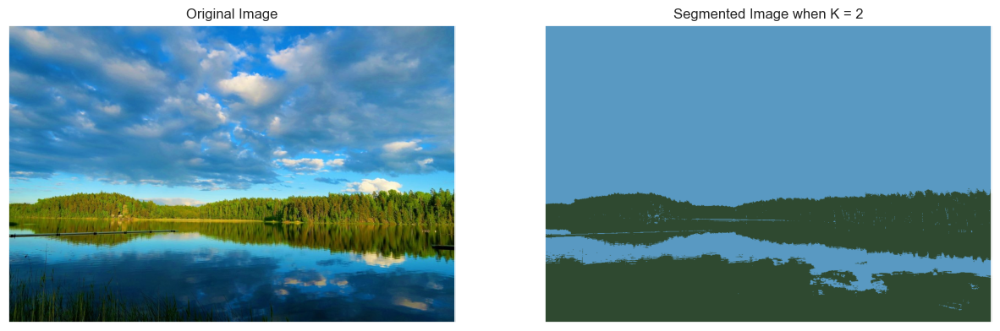

In [4]:
# Original image using only 2 colors
segment_image(2, img)

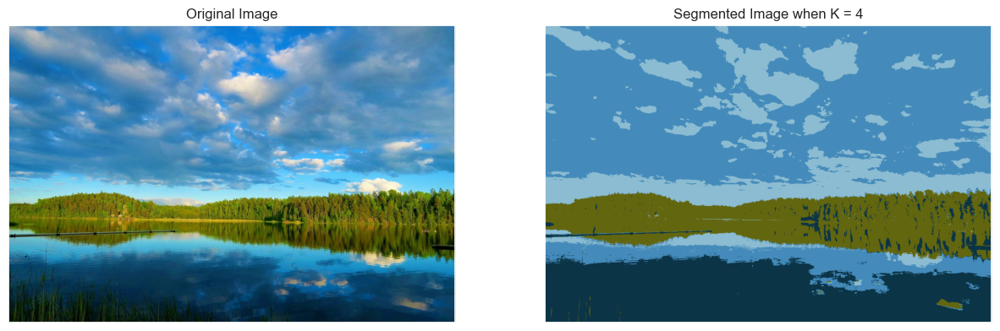

In [5]:
# Original image using only 4 colors
segment_image(4, img)

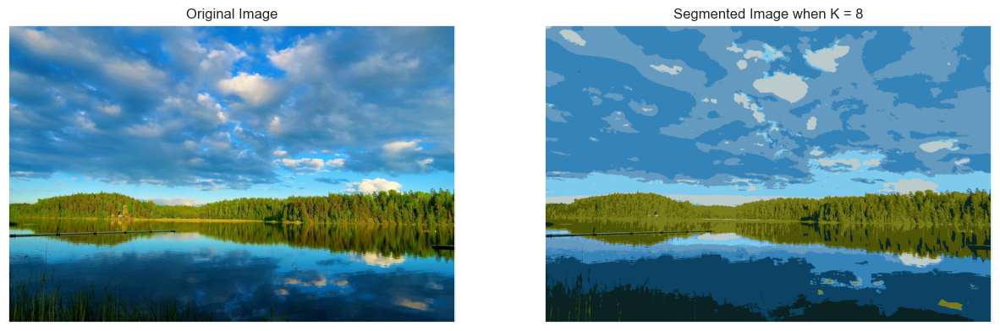

In [6]:
# Original image using only 8 colors
segment_image(8, img)

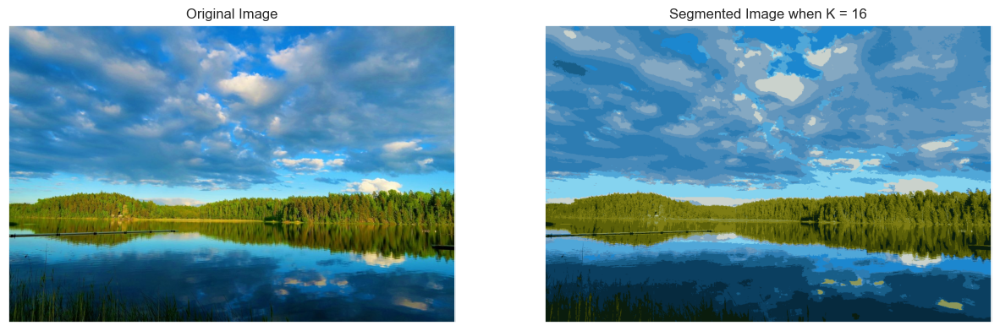

In [7]:
# Original image using only 16 colors
segment_image(16,img)

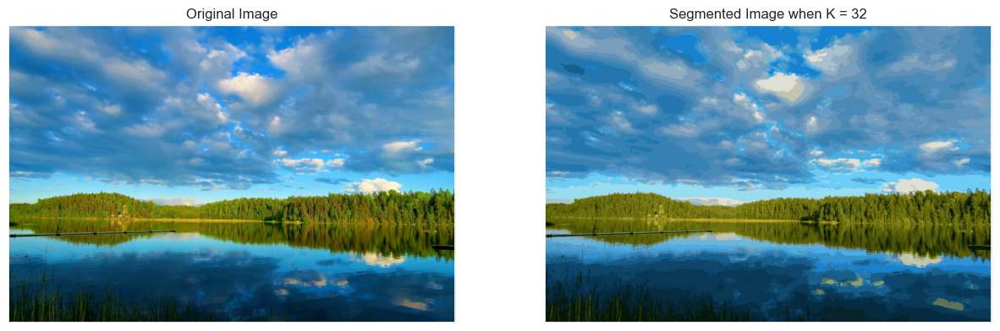

In [8]:
# Original image using only 32 colors
segment_image(32, img)

### Note:
The above image has a fairly large color palette, so the K value must be quite high so that our image starts to look good. For K=16 the image starts to look quite good, while for K=32 you have to take good look to see the differences.

# 2.2. Possible colors

In [9]:
landscape = img/ 255.0 # use 0...1 scale
landscape = landscape.reshape(800 * 1200, 3)
landscape.shape

(960000, 3)

In [10]:
def plot_pixels(landscape, title, colors=None, N=10000):
    if colors is None:
        colors = landscape
    
    # choose a random subset
    rng = np.random.RandomState(0)
    i = rng.permutation(landscape.shape[0])[:N]
    colors = colors[i]
    R, G, B = landscape[i].T
    
    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    ax[0].scatter(R, G, color=colors, marker='.')
    ax[0].set(xlabel='Red', ylabel='Green', xlim=(0, 1), ylim=(0, 1))

    ax[1].scatter(R, B, color=colors, marker='.')
    ax[1].set(xlabel='Red', ylabel='Blue', xlim=(0, 1), ylim=(0, 1))

    fig.suptitle(title, size=20);

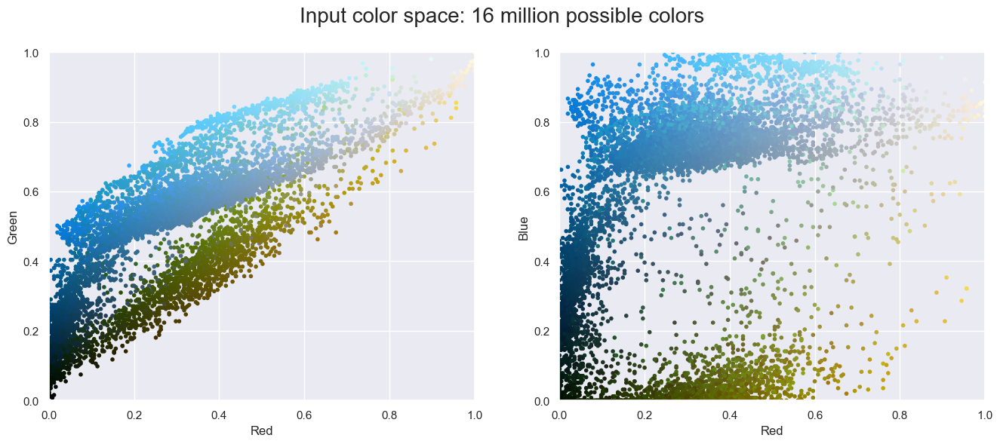

In [11]:
plot_pixels(landscape, title='Input color space: 16 million possible colors')

# 2.3. Canny Edge detection 
It is an image processing method used to detect edges in an image while suppressing noise.

### The Canny Edge detection algorithm is composed of 5 steps:
1. Gradient calculation
2. Non-maximum suppression
3. Double threshold
4. Edge Tracking by Hysteresis

OpenCV provides **cv2.Canny(image, threshold1,threshold2)** function for edge detection.


The first argument is our input image. Second and third arguments are our min and max threshold respectively.


The function finds edges in the input image(8-bit input image) and marks them in the output map edges using the Canny algorithm. The smallest value between threshold1 and threshold2 is used for edge linking. The largest value is used to find initial segments of strong edges.

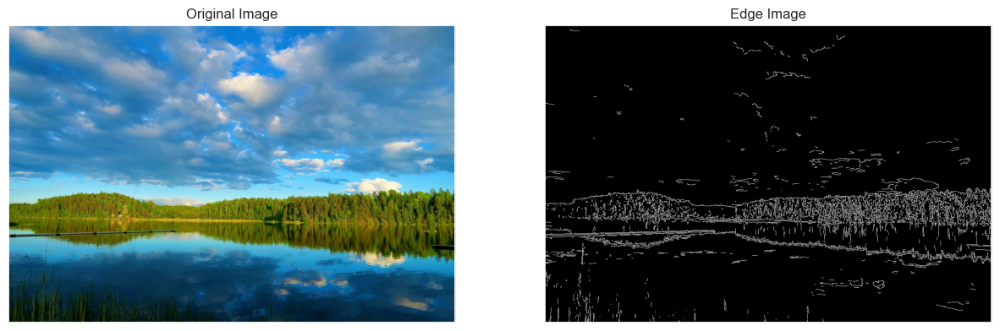

In [12]:
figure_size = 15
edges = cv2.Canny(img,150,200)
plt.figure(figsize=(figure_size, figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

# 3.1. Pearson photo segmentation for given K value

In [36]:
# Loading the image in RGB color space
original_image = cv2.imread("image2.jpg")

img=cv2.cvtColor(original_image,cv2.COLOR_BGR2RGB)

vectorized = img.reshape((-1,3))

vectorized = np.float32(vectorized)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

In [37]:
# Below I'm defining a function for segmenting an image into a given number of colors
def segment_image(Kval, name):
    K = Kval
    attempts=10
    ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS) 
    center = np.uint8(center)
    res = center[label.flatten()]
    result_image = res.reshape((name.shape))
    figure_size = 15
    plt.figure(figsize=(figure_size,figure_size))
    plt.subplot(1,2,1),plt.imshow(name)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(1,2,2),plt.imshow(result_image)
    plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
    plt.show()

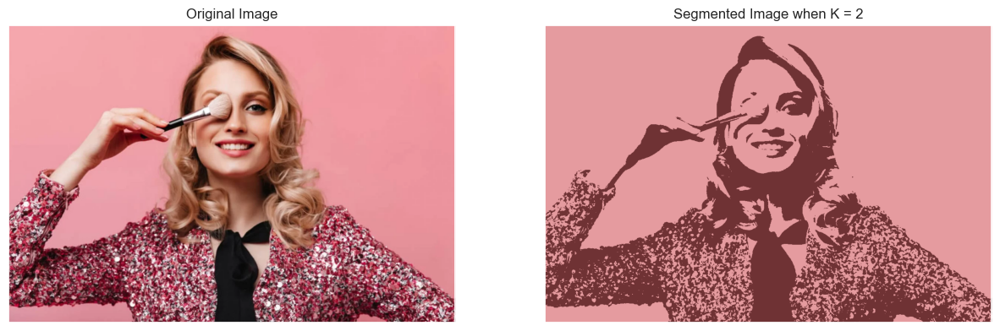

In [38]:
# Original image using only 2 colors
segment_image(2, img)

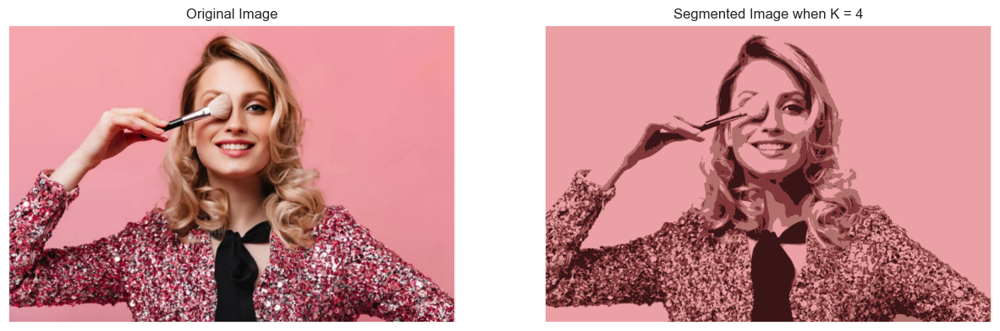

In [39]:
# Original image using only 4 colors
segment_image(4, img)

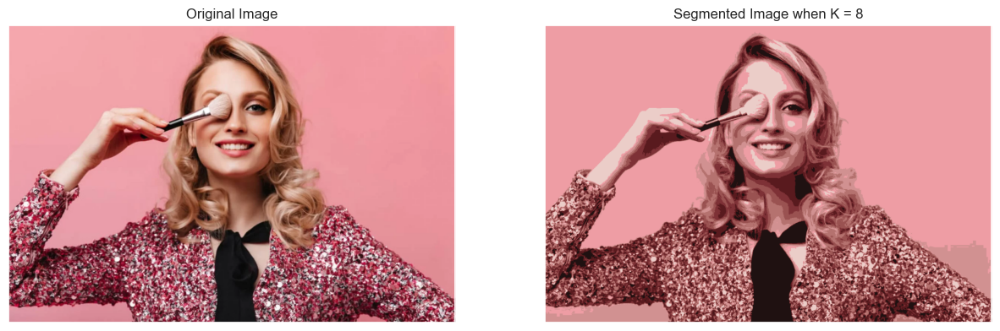

In [40]:
# Original image using only 8 colors
segment_image(8, img)

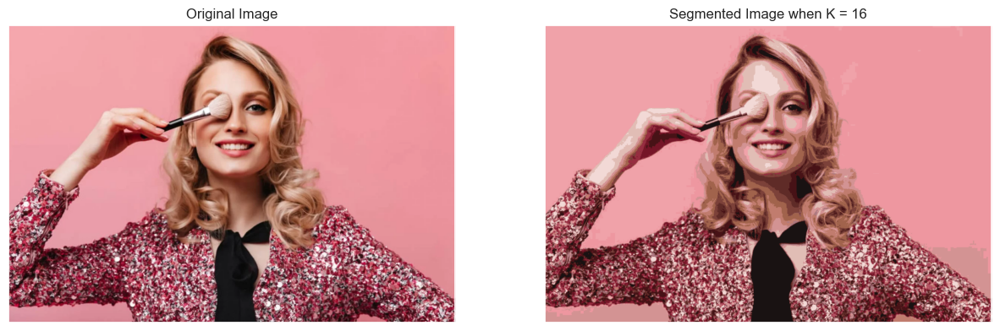

In [41]:
# Original image using only 16 colors
segment_image(16, img)

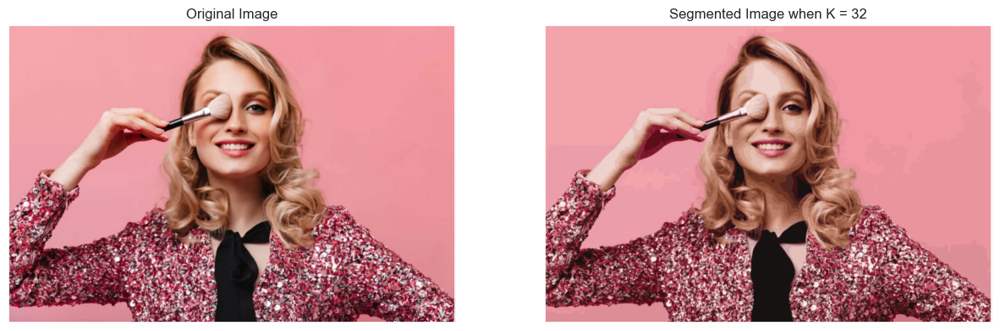

In [42]:
# Original image using only 32 colors
segment_image(32, img)

# Note:
For K = 32, the second female image is slightly worse than the first for K of the same value. For this particular example, a higher K would have to be used.

# 3.2. Possible colors

In [43]:
photo = img/ 255.0 # use 0...1 scale
photo = photo.reshape(800 * 1200, 3)
photo.shape

(960000, 3)

In [44]:
def plot_pixels(photo, title, colors=None, N=10000):
    if colors is None:
        colors = photo
    
    # choose a random subset
    rng = np.random.RandomState(0)
    i = rng.permutation(photo.shape[0])[:N]
    colors = colors[i]
    R, G, B = photo[i].T
    
    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    ax[0].scatter(R, G, color=colors, marker='.')
    ax[0].set(xlabel='Red', ylabel='Green', xlim=(0, 1), ylim=(0, 1))

    ax[1].scatter(R, B, color=colors, marker='.')
    ax[1].set(xlabel='Red', ylabel='Blue', xlim=(0, 1), ylim=(0, 1))

    fig.suptitle(title, size=20);

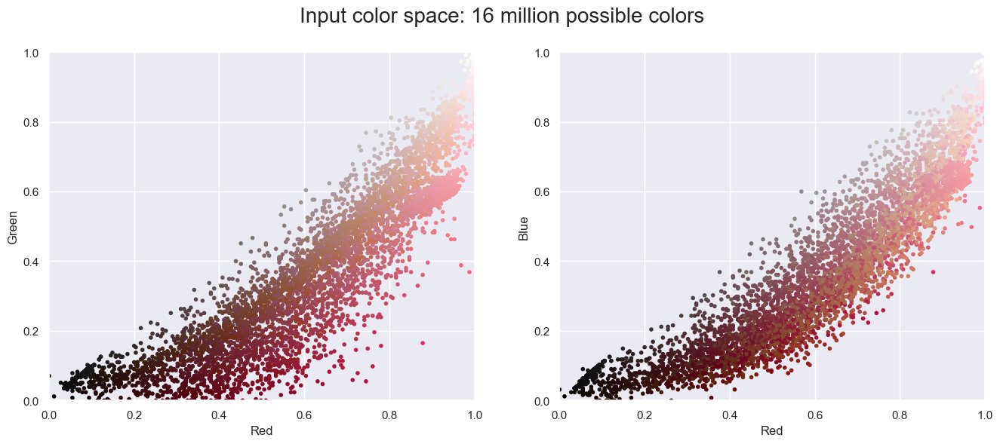

In [45]:
plot_pixels(photo, title='Input color space: 16 million possible colors')

# 3.3. Canny Edge detection 
It is an image processing method used to detect edges in an image while suppressing noise.

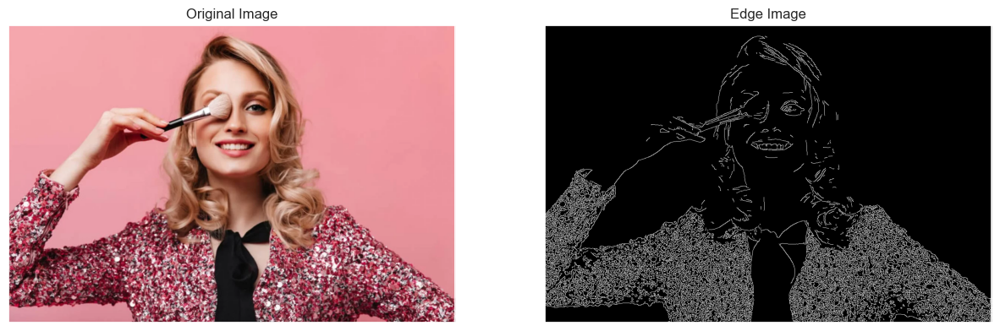

In [46]:
figure_size = 15
edges = cv2.Canny(img,150,200)
plt.figure(figsize=(figure_size, figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

# 4.1. Photo segmentation for given K value

In [47]:
# Loading the image in RGB color space
original_image = cv2.imread("image3.jpg")

img=cv2.cvtColor(original_image,cv2.COLOR_BGR2RGB)

vectorized = img.reshape((-1,3))

vectorized = np.float32(vectorized)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

In [48]:
# Below I'm defining a function for segmenting an image into a given number of colors
def segment_image(Kval, name):
    K = Kval
    attempts=10
    ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS) 
    center = np.uint8(center)
    res = center[label.flatten()]
    result_image = res.reshape((name.shape))
    figure_size = 15
    plt.figure(figsize=(figure_size,figure_size))
    plt.subplot(1,2,1),plt.imshow(name)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(1,2,2),plt.imshow(result_image)
    plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
    plt.show()

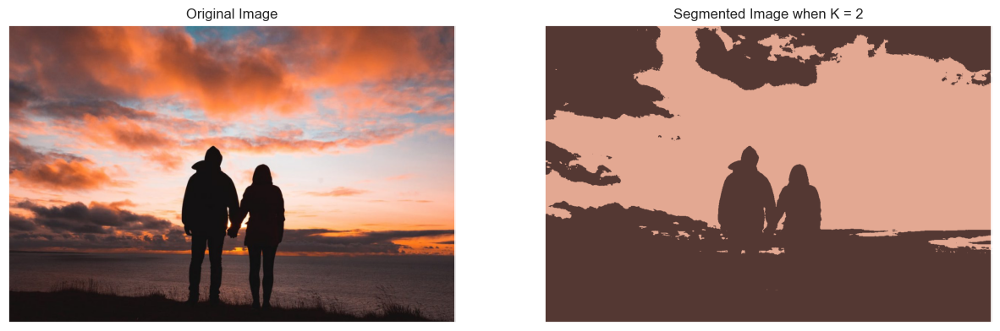

In [49]:
# Original image using only 2 colors
segment_image(2, img)

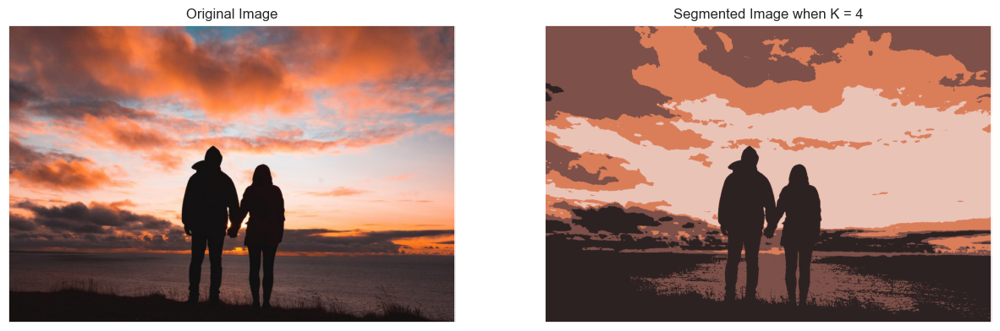

In [50]:
# Original image using only 2 colors
segment_image(4, img)

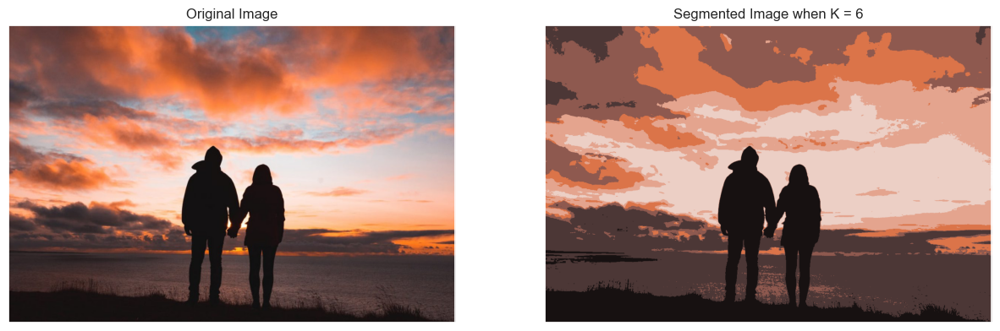

In [51]:
# Original image using only 2 colors
segment_image(6, img)

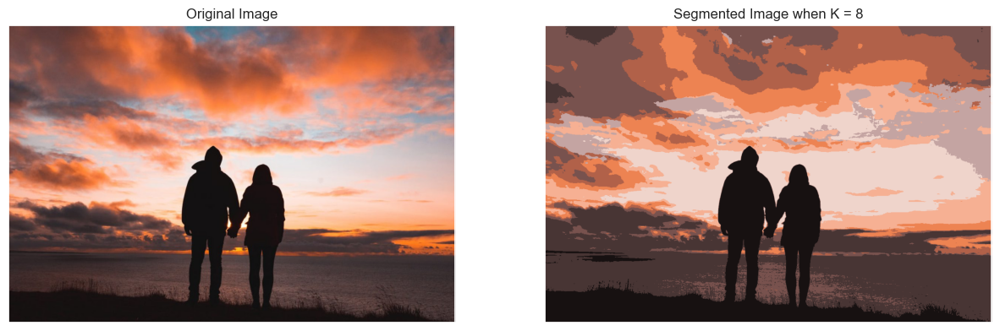

In [52]:
# Original image using only 2 colors
segment_image(8, img)

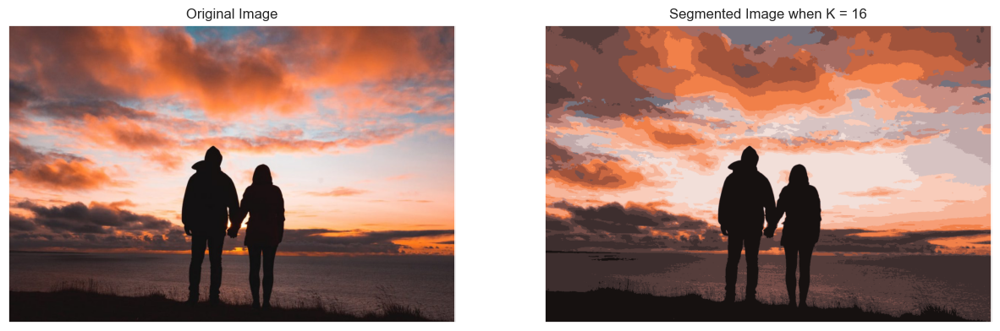

In [53]:
# Original image using only 2 colors
segment_image(16, img)

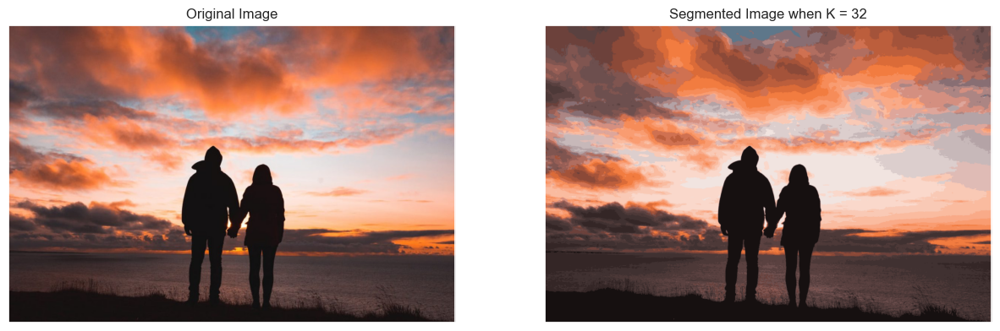

In [54]:
# Original image using only 2 colors
segment_image(32, img)

### Note:

As before, the graphics for K=32 are starting to look quite good.

# 4.2. Possible colors

In [55]:
photo2 = img/ 255.0 # use 0...1 scale
photo2 = photo2.reshape(800 * 1200, 3)
photo2.shape

(960000, 3)

In [56]:
def plot_pixels(photo2, title, colors=None, N=10000):
    if colors is None:
        colors = photo2
    
    # choose a random subset
    rng = np.random.RandomState(0)
    i = rng.permutation(photo2.shape[0])[:N]
    colors = colors[i]
    R, G, B = photo2[i].T
    
    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    ax[0].scatter(R, G, color=colors, marker='.')
    ax[0].set(xlabel='Red', ylabel='Green', xlim=(0, 1), ylim=(0, 1))

    ax[1].scatter(R, B, color=colors, marker='.')
    ax[1].set(xlabel='Red', ylabel='Blue', xlim=(0, 1), ylim=(0, 1))

    fig.suptitle(title, size=20);

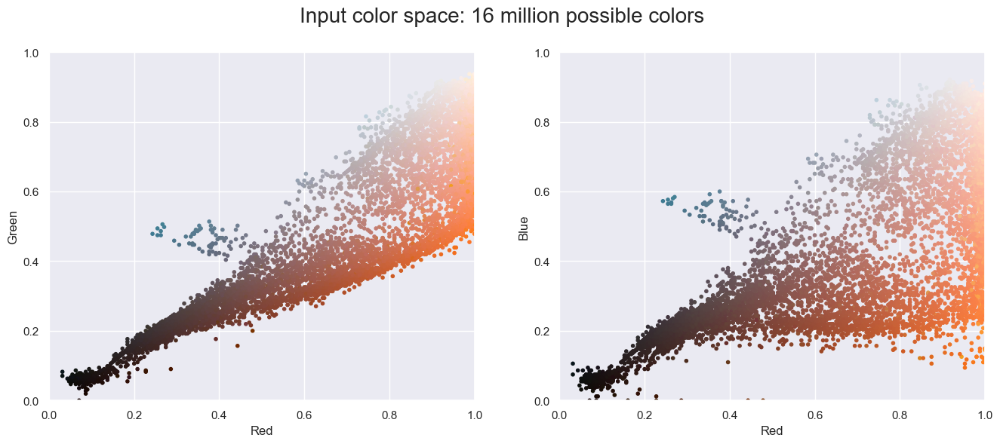

In [57]:
plot_pixels(photo2, title='Input color space: 16 million possible colors')

# 4.3. Canny Edge detection 
It is an image processing method used to detect edges in an image while suppressing noise.

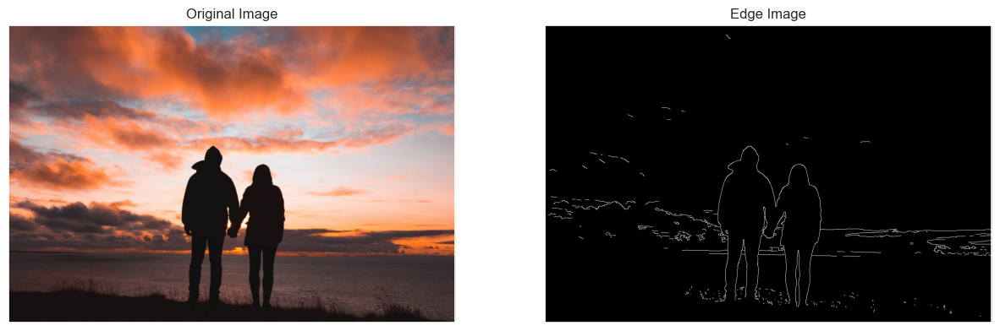

In [58]:
figure_size = 15
edges = cv2.Canny(img,150,200)
plt.figure(figsize=(figure_size, figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

### Note:

The graphic doesn't have many clearly visible edges, so the image with edges didn't come out the best